<a href="https://colab.research.google.com/github/KarolMc/msc_dissertation/blob/main/imbalance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install imblearn

import pandas as pd

import numpy as np

from numpy import mean

# Import SVC from sklearn.svm and accuracy_score from sklearn.metrics
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 47.7 MB/s eta 0:00:00
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.0
    Uninstalling joblib-1.1.0:
      Successfully uninstalled joblib-1.1.0


In [ ]:
from sklearn.preprocessing import LabelEncoder
from collections import Counter
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# import data 
nhanes_df = pd.read_csv('/notebooks/Data/raw_data/selected_raw_lab_exam_data_merged.csv', index_col=[0])

In [ ]:
import random

random_seed = random.seed(42)

In [ ]:
# set up display area to show dataframe in jupyter qtconsole

# pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [ ]:
nhanes_df.head()

,SEQN,RIDSTATR,RIDAGEYR,DMDHHSIZ,DMDFMSIZ,INDFMPIR,LBXSF2SI,URXUMA,URXUMS,URXCRS,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBDBANO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXMC,LBXRDW,LBXPLTSI,LBXMPSI,URXUP8,URXNO3,URXSCN,LBXGLU,LBXGLT,URXUAS,URXUAS3,URXUAS5,URXUAB,URXUAC,URXUDMA,URXUMMA,URDUMMAL,URXUTM,SSKLOTH,URXUIO,LBXCOT,LBXTC,LBDTCSI,LBDHDD,LBDHDDSI,LBXRBFSI,LBXFOLSI,LBXVIDMS,LBXVD2MS,LBXVD3MS,LBXVE3MS,LBXBCD,LBDBCDSI,LBXBPB,LBDBPBSI,LBXTHG,LBDTHGSI,LBXGH,LBDTRSI,LBDLDLSI,URXUBA,URXUCD,URXUCO,URXUCS,URXUMO,URXUPB,URXUSB,URXUTL,URXUTU,URXUUR,LBDSALSI,LBXSATSI,LBXSASSI,LBXSAPSI,LBDSBUSI,LBDSCASI,LBDSCHSI,LBXSC3SI,LBDSCRSI,LBXSGTSI,LBDSGLSI,LBDSIRSI,LBXSLDSI,LBDSPHSI,LBDSTBSI,LBDSTPSI,LBDSTRSI,LBDSUASI,LBXSNASI,LBXSKSI,LBXSCLSI,LBXSOSSI,LBDSGBSI,URDACT,LBDRFOSI,LBDBSESI,LBDBMNSI,LBXSF1SI,LBXSF3SI,LBXSF4SI,LBXSF5SI,LBXSF6SI,Served_Military,No_military_service,Male,Female,BMXWT,BMXHT,BMXBMI,BMXLEG,BMXARML,BMXARMC,BMXWAIST,BPXPLS,BPXSY1,BPXDI1,BMDAVSAD,Born_US,Born_non_US,US_citizen,Not_US_citizen,AdultEd_less9th_grade,AdultEd_9to11_grade,AdultEd_GED,AdultEd_Some_college,AdultEd_College_grad_or_above,AdultEd_Under_20,ChildEd_10th_to_12thGrade,ChildEd_5thGrade_or_lower,ChildEd_6th_to_9thGrade,ChildEd_Adult,ChildEd_HS_Grad,ChildEd_None_KG,Marital_Status_Child,Marital_Status_Divorced,Marital_Status_Living_with_Partner,Marital_Status_Married,Marital_Status_Never_Married,Marital_Status_Separated,Marital_Status_Widowed,Family_income_10-15k,Family_income_15-20k,Family_income_20-25k,Family_income_25-35k,Family_income_35-45k,Family_income_45-55k,Family_income_5-10k,Family_income_55-65k,Family_income_65-75k,Family_income_75-100k,Family_income_greater100k,Family_income_less4999,Household_income_10-15k,Household_income_15-20k,Household_income_20-25k,Household_income_25-35k,Household_income_35-45k,Household_income_45-55k,Household_income_5-10k,Household_income_55-65k,Household_income_65-75k,Household_income_75-100k,Household_income_greater100k,Household_income_less4999,Not_pregnant,Pregnant,Race_Mexican_American,Race_Non_Hispanic_Asian,Race_Non_Hispanic_Black,Race_Non_Hispanic_White,Race_Other/Multi_racial,Race_Other_Hispanic,URXUCR,HPV_negative,HPV_not_applicable,HPV_positive,HCV_negative,HCV_positive,chlamydia_negative,chlamydia_positive,HSV1_negative,HSV1_positive,2.0,3.0,HSV2_negative,HSV2_positive,HEPA_negative,HEPA_positive,HEPB_negative,HEPB_positive,HEPD_negative,HEPD_positive,Decayed_teeth,No_decayed_teeth,Gum_disease,No_gum_disease,BPCuff_Adult,BPCuff_Child,BPCuff_Large,BPCuff_Thigh,BPCuff_infant,Pulse_irregular,Pulse_regular,BMI_Healthy,BMI_Obese,BMI_Overweight,BMI_Underweight,BMI_unknown
0,41475,2.0,62.0,2.0,2.0,1.83,0.68,7.9,7.9,3978.0,8.5,20.0,4.7,73.8,1.2,0.4,1.7,0.4,6.3,1.000000e-01,5.397605e-79,4.51,14.1,41.6,92.1,31.3,34.0,13.4,366.0,7.1,4.62,4.62,1630.0,NaN,NaN,7.70,0.08,0.56,0.28,0.08,1.27,0.14,5.397605e-79,0.18,544.3,210.1,0.000,179.0,4.63,47.0,1.22,2490.0,54.4,58.8,0.0,57.3,4.17,0.20,1.78,1.10,0.053,0.20,0.0,5.7,1.073,2.741,1.21,0.146,0.394,4.44,46.7,0.40,0.053,0.161,0.084,0.0058,36.0,26.0,24.0,113.0,4.64,2.375,4.422,23.0,45.97,22.0,5.88,8.4,80.0,0.969,10.26,76.0,1.818,386.6,134.0,3.6,100.0,269.0,40.0,7.65,1060.0,2.36,177.09,38.5,0.141,0.84,0.141,1.36,0,1,0,1,138.9,154.7,58.04,34.2,37.6,45.2,156.3,66.0,128.0,64.0,20.7,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,45.0,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0
1,41476,2.0,6.0,6.0,6.0,5.00,0.68,4.8,4.8,6365.0,7.5,41.4,6.1,48.7,3.2,0.6,3.1,0.5,3.7,2.000000e-01,5.397605e-79,4.68,13.6,38.8,83.0,29.0,34.9,12.5,352.0,6.4,11.50,11.50,2690.0,NaN,NaN,7.70,0.08,0.56,0.28,0.08,1.27,0.14,5.397605e-79,0.18,698.0,244.6,0.000,143.0,3.70,45.0,1.16,897.0,32.3,80.9,0.0,79.4,5.52,0.14,1.25,1.94,0.094,2.60,13.0,5.5,1.073,2.741,1.21,0.146,0.394,4.44,46.7,0.40,0.053,0.161,0.084,0.0058,43.0,20.0,23.0,68.0,4.28,2.350,4.732,25.0,72.49,18.0,5.11,14.3,127.0,1.2

In [ ]:
def diabetes_checker(row):
  if row['LBXGH'] >= 6.5 or row['LBXGLU'] >= 126 or row['LBXGLT'] >= 200:
    return 3
  elif (row['LBXGH'] >= 5.7 and row['LBXGH'] <6.5) or (row['LBXGLU'] >= 100 and row['LBXGLU'] < 126) or (row['LBXGLT'] >= 140 and row['LBXGLT'] < 200):
    return 2
  else:
    return 1

In [ ]:
diabetes_status = nhanes_df.apply(lambda row : diabetes_checker(row), axis=1) 

In [ ]:
nhanes_df['Diabetes_status']= diabetes_status

In [ ]:
nhanes_df['Diabetes_status']

0        2
1        1
2        3
3        1
4        2
        ..
48705    1
48706    1
48707    1
48708    1
48709    1
Name: Diabetes_status, Length: 48710, dtype: int64

In [ ]:
nhanes_df['Diabetes_status'].value_counts()

1    33684
2    10939
3     4087
Name: Diabetes_status, dtype: int64

In [ ]:

# removing indicator variables (ie those used to determine diabetes status)

nhanes_df = nhanes_df.drop(['LBXGH', 'LBXGLU', 'LBDSGLSI', 'LBXGLT'], axis = 1)

In [ ]:
columns = nhanes_df.columns

In [ ]:
y = nhanes_df.pop('Diabetes_status')
X = nhanes_df

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=random_seed)


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)

In [ ]:
y_test = le.fit_transform(y_test)

# Baseline 

In [ ]:
DT_base_model = DecisionTreeClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(DT_base_model, X_train, y_train, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.713


In [ ]:
DT_base_model.fit(X_train, y_train)

DecisionTreeClassifier()

Accuracy of DecisionTreeClassifier() is 0.7066841845951716
              precision    recall  f1-score   support

     class 1       0.84      0.83      0.84      8396
     class 2       0.44      0.45      0.45      2728
     class 3       0.35      0.35      0.35      1054

    accuracy                           0.71     12178
   macro avg       0.54      0.54      0.54     12178
weighted avg       0.71      0.71      0.71     12178



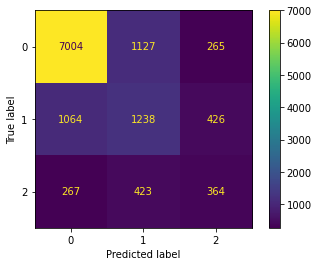

In [ ]:
y_pred= DT_base_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(DT_base_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=DT_base_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=DT_base_model.classes_).plot()
plt.show()

In [ ]:
RF_base_model = RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800, random_state=random_seed)
# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(RF_base_model, X_train, y_train, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

/usr/local/lib/python3.9/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


F-measure: 0.778


In [ ]:
RF_base_model.fit(X_train, y_train)

RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800)

Accuracy of RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800) is 0.7786992938085071
              precision    recall  f1-score   support

     class 1       0.86      0.91      0.89      8396
     class 2       0.53      0.56      0.55      2728
     class 3       0.77      0.26      0.39      1054

    accuracy                           0.78     12178
   macro avg       0.72      0.58      0.61     12178
weighted avg       0.78      0.78      0.77     12178



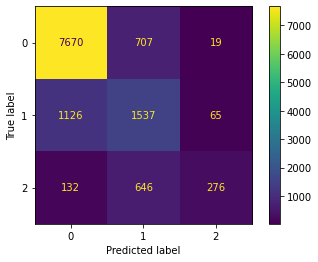

In [ ]:
y_pred= RF_base_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(RF_base_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=RF_base_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=RF_base_model.classes_).plot()
plt.show()

In [ ]:

le = LabelEncoder()
y_train = le.fit_transform(y_train)

In [ ]:
y_test = le.fit_transform(y_test)

In [ ]:
XGB_base_model = xgboost.XGBClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(XGB_base_model, X_train, y_train, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.805


In [ ]:
XGB_base_model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

Accuracy of XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...) is 0.8114632944654294
              precision    recall  f1-score   support

     class 1       0.88      0.91      0.89      8396
     class 2       0.60      0.60      0.60      2728
     class 3       0.79      0.57      0.66      1054

    accuracy                       

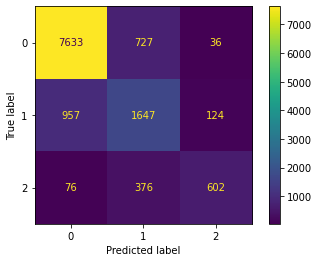

In [ ]:
y_pred= XGB_base_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(XGB_base_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=XGB_base_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=XGB_base_model.classes_).plot()
plt.show()

In [ ]:
cat_base_model = catboost.CatBoostClassifier(random_seed=random_seed)

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(cat_base_model, X_train, y_train, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

Learning rate set to 0.094555
0:	learn: 1.0123304	total: 238ms	remaining: 3m 58s
1:	learn: 0.9436062	total: 348ms	remaining: 2m 53s
2:	learn: 0.8875541	total: 510ms	remaining: 2m 49s
3:	learn: 0.8391656	total: 631ms	remaining: 2m 37s
4:	learn: 0.7997883	total: 803ms	remaining: 2m 39s
5:	learn: 0.7627329	total: 935ms	remaining: 2m 34s
6:	learn: 0.7337720	total: 1.14s	remaining: 2m 41s
7:	learn: 0.7089090	total: 1.32s	remaining: 2m 43s
8:	learn: 0.6864372	total: 1.5s	remaining: 2m 45s
9:	learn: 0.6659927	total: 1.71s	remaining: 2m 49s
10:	learn: 0.6486043	total: 1.87s	remaining: 2m 48s
11:	learn: 0.6320749	total: 2.01s	remaining: 2m 45s
12:	learn: 0.6183632	total: 2.17s	remaining: 2m 44s
13:	learn: 0.6047317	total: 2.31s	remaining: 2m 42s
14:	learn: 0.5931105	total: 2.41s	remaining: 2m 38s
15:	learn: 0.5831820	total: 2.54s	remaining: 2m 36s
16:	learn: 0.5727612	total: 2.72s	remaining: 2m 37s
17:	learn: 0.5642025	total: 2.88s	remaining: 2m 37s
18:	learn: 0.5570172	total: 3.03s	remaining: 

In [ ]:
cat_base_model.fit(X_train, y_train)

Learning rate set to 0.095065
0:	learn: 1.0117500	total: 36.9ms	remaining: 36.9s
1:	learn: 0.9439464	total: 64.4ms	remaining: 32.1s
2:	learn: 0.8846655	total: 92.1ms	remaining: 30.6s
3:	learn: 0.8392782	total: 118ms	remaining: 29.5s
4:	learn: 0.8006609	total: 145ms	remaining: 28.9s
5:	learn: 0.7658954	total: 171ms	remaining: 28.3s
6:	learn: 0.7346355	total: 199ms	remaining: 28.2s
7:	learn: 0.7102048	total: 229ms	remaining: 28.5s
8:	learn: 0.6881534	total: 261ms	remaining: 28.7s
9:	learn: 0.6663720	total: 290ms	remaining: 28.7s
10:	learn: 0.6476831	total: 320ms	remaining: 28.8s
11:	learn: 0.6320405	total: 348ms	remaining: 28.7s
12:	learn: 0.6180664	total: 378ms	remaining: 28.7s
13:	learn: 0.6037231	total: 407ms	remaining: 28.7s
14:	learn: 0.5919711	total: 435ms	remaining: 28.6s
15:	learn: 0.5826082	total: 461ms	remaining: 28.3s
16:	learn: 0.5732356	total: 488ms	remaining: 28.2s
17:	learn: 0.5655654	total: 517ms	remaining: 28.2s
18:	learn: 0.5577016	total: 547ms	remaining: 28.2s
19:	lear

Accuracy of <catboost.core.CatBoostClassifier object at 0x7fc7ff0992e0> is 0.8089177204795533
              precision    recall  f1-score   support

     class 1       0.88      0.91      0.89      8396
     class 2       0.59      0.59      0.59      2728
     class 3       0.79      0.56      0.66      1054

    accuracy                           0.81     12178
   macro avg       0.75      0.69      0.71     12178
weighted avg       0.81      0.81      0.81     12178



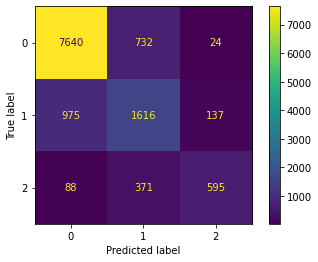

In [ ]:
y_pred= cat_base_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(cat_base_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=cat_base_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=cat_base_model.classes_).plot()
plt.show()

In [ ]:
light_base_model = lightgbm.LGBMClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(light_base_model, X_train, y_train, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.809


In [ ]:
light_base_model.fit(X_train, y_train)

LGBMClassifier()

Accuracy of LGBMClassifier() is 0.8127771391033011
              precision    recall  f1-score   support

     class 1       0.88      0.91      0.90      8396
     class 2       0.60      0.61      0.61      2728
     class 3       0.79      0.58      0.67      1054

    accuracy                           0.81     12178
   macro avg       0.76      0.70      0.72     12178
weighted avg       0.81      0.81      0.81     12178



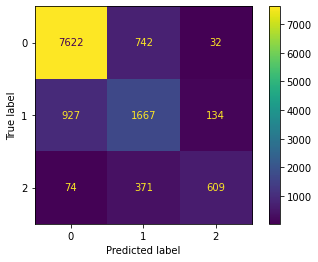

In [ ]:
y_pred= light_base_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(light_base_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=light_base_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=light_base_model.classes_).plot()
plt.show()

## Random oversampling to address class distribution

In [ ]:
print(Counter(y_train))

Counter({0: 25288, 1: 8211, 2: 3033})


In [ ]:
over = RandomOverSampler(random_state=random_seed, sampling_strategy='not majority')

In [ ]:
X_train_ROS, y_train_ROS = over.fit_resample(X_train, y_train)
print(Counter(y_train_ROS))

Counter({0: 25288, 1: 25288, 2: 25288})


In [ ]:
# X_test.to_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/X_test.csv')

In [ ]:
# y_test.to_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/y_test.csv')

In [ ]:
# X_train_ROS.to_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/X_train_ROS.csv')

In [ ]:
# y_train_ROS.to_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/y_train_ROS.csv')

In [ ]:
X_train_ROS.head()

,SEQN,RIDSTATR,RIDAGEYR,DMDHHSIZ,DMDFMSIZ,INDFMPIR,LBXSF2SI,URXUMA,URXUMS,URXCRS,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBDBANO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXMC,LBXRDW,LBXPLTSI,LBXMPSI,URXUP8,URXNO3,URXSCN,URXUAS,URXUAS3,URXUAS5,URXUAB,URXUAC,URXUDMA,URXUMMA,URDUMMAL,URXUTM,SSKLOTH,URXUIO,LBXCOT,LBXTC,LBDTCSI,LBDHDD,LBDHDDSI,LBXRBFSI,LBXFOLSI,LBXVIDMS,LBXVD2MS,LBXVD3MS,LBXVE3MS,LBXBCD,LBDBCDSI,LBXBPB,LBDBPBSI,LBXTHG,LBDTHGSI,LBDTRSI,LBDLDLSI,URXUBA,URXUCD,URXUCO,URXUCS,URXUMO,URXUPB,URXUSB,URXUTL,URXUTU,URXUUR,LBDSALSI,LBXSATSI,LBXSASSI,LBXSAPSI,LBDSBUSI,LBDSCASI,LBDSCHSI,LBXSC3SI,LBDSCRSI,LBXSGTSI,LBDSIRSI,LBXSLDSI,LBDSPHSI,LBDSTBSI,LBDSTPSI,LBDSTRSI,LBDSUASI,LBXSNASI,LBXSKSI,LBXSCLSI,LBXSOSSI,LBDSGBSI,URDACT,LBDRFOSI,LBDBSESI,LBDBMNSI,LBXSF1SI,LBXSF3SI,LBXSF4SI,LBXSF5SI,LBXSF6SI,Served_Military,No_military_service,Male,Female,BMXWT,BMXHT,BMXBMI,BMXLEG,BMXARML,BMXARMC,BMXWAIST,BPXPLS,BPXSY1,BPXDI1,BMDAVSAD,Born_US,Born_non_US,US_citizen,Not_US_citizen,AdultEd_less9th_grade,AdultEd_9to11_grade,AdultEd_GED,AdultEd_Some_college,AdultEd_College_grad_or_above,AdultEd_Under_20,ChildEd_10th_to_12thGrade,ChildEd_5thGrade_or_lower,ChildEd_6th_to_9thGrade,ChildEd_Adult,ChildEd_HS_Grad,ChildEd_None_KG,Marital_Status_Child,Marital_Status_Divorced,Marital_Status_Living_with_Partner,Marital_Status_Married,Marital_Status_Never_Married,Marital_Status_Separated,Marital_Status_Widowed,Family_income_10-15k,Family_income_15-20k,Family_income_20-25k,Family_income_25-35k,Family_income_35-45k,Family_income_45-55k,Family_income_5-10k,Family_income_55-65k,Family_income_65-75k,Family_income_75-100k,Family_income_greater100k,Family_income_less4999,Household_income_10-15k,Household_income_15-20k,Household_income_20-25k,Household_income_25-35k,Household_income_35-45k,Household_income_45-55k,Household_income_5-10k,Household_income_55-65k,Household_income_65-75k,Household_income_75-100k,Household_income_greater100k,Household_income_less4999,Not_pregnant,Pregnant,Race_Mexican_American,Race_Non_Hispanic_Asian,Race_Non_Hispanic_Black,Race_Non_Hispanic_White,Race_Other/Multi_racial,Race_Other_Hispanic,URXUCR,HPV_negative,HPV_not_applicable,HPV_positive,HCV_negative,HCV_positive,chlamydia_negative,chlamydia_positive,HSV1_negative,HSV1_positive,2.0,3.0,HSV2_negative,HSV2_positive,HEPA_negative,HEPA_positive,HEPB_negative,HEPB_positive,HEPD_negative,HEPD_positive,Decayed_teeth,No_decayed_teeth,Gum_disease,No_gum_disease,BPCuff_Adult,BPCuff_Child,BPCuff_Large,BPCuff_Thigh,BPCuff_infant,Pulse_irregular,Pulse_regular,BMI_Healthy,BMI_Obese,BMI_Overweight,BMI_Underweight,BMI_unknown
0,71180,2.0,57.0,7.0,7.0,1.80,0.68,5.6,5.6,7248.8,8.4,25.0,9.9,64.4,0.7,5.397605e-79,2.1,0.8,5.4,1.000000e-01,5.397605e-79,6.39,16.9,52.2,81.6,26.5,32.4,14.5,328.0,8.1,3.34,3.34,1070.0,7.7,0.08,0.56,0.28,0.08,1.27,0.14,5.397605e-79,0.18,698.0,150.1,0.041,178.0,4.60,51.0,1.32,1030.0,40.3,15.2,0.0,13.73,0.00,0.66,5.87,3.70,0.179,10.48,52.3,1.073,2.741,1.21,0.146,0.394,4.44,46.7,0.4,0.053,0.161,0.084,0.0058,43.0,20.0,23.0,68.0,4.28,2.350,4.732,25.0,72.49,18.0,14.3,127.0,1.227,10.26,72.0,1.264,315.2,139.0,4.0,104.0,278.0,28.0,6.83,739.0,2.45,249.52,38.5,0.141,0.84,0.141,1.36,0,1,1,0,50.5,160.3,19.7,38.0,35.0,27.0,74.0,74.0,118.0,62.0,16.4,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,82.0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,0,1,1,0,0,0,0
1,66825,2.0,8.0,4.0,4.0,1.56,0.68,13.6,13.6,10342.8,6.1,34.4,2.3,60.5,0.6,2.200000e+00,2.1,0.1,3.7,5.397605e-79,1.000000e-01,5.30,13.9,42.6,80.6,26.2,32.7,12.3,256.0,6.6,3.34,3.34,1070.0,7.7,0.08,0.56,0.28,0.08,1.27,0.14,5.397605e-79,0.18,698.0,150.1,0.107,228.0,5.90,89.0,2.30,1030.0,40.3,101.0,0.0,99.69,7.95,0.11,0.00,1.59,0.077,0.67,3.3,1.073,2.741,1.21,0.146,0.394,4.44,46.7,0.4,0.053,0.161,0.084,0.0058,43.0,20.0,23.0,68.0,4.28,2.350,4.732,25.0,72.49,18.0,14.3,127.0,1.227,10.26,72.0,1.264,315.2,139.0,4.0,104.0,278.

In [ ]:
# X_test_ROS.drop(['Unnamed: 0'], axis = 1)
X_test.head()


,SEQN,RIDSTATR,RIDAGEYR,DMDHHSIZ,DMDFMSIZ,INDFMPIR,LBXSF2SI,URXUMA,URXUMS,URXCRS,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBDBANO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXMC,LBXRDW,LBXPLTSI,LBXMPSI,URXUP8,URXNO3,URXSCN,URXUAS,URXUAS3,URXUAS5,URXUAB,URXUAC,URXUDMA,URXUMMA,URDUMMAL,URXUTM,SSKLOTH,URXUIO,LBXCOT,LBXTC,LBDTCSI,LBDHDD,LBDHDDSI,LBXRBFSI,LBXFOLSI,LBXVIDMS,LBXVD2MS,LBXVD3MS,LBXVE3MS,LBXBCD,LBDBCDSI,LBXBPB,LBDBPBSI,LBXTHG,LBDTHGSI,LBDTRSI,LBDLDLSI,URXUBA,URXUCD,URXUCO,URXUCS,URXUMO,URXUPB,URXUSB,URXUTL,URXUTU,URXUUR,LBDSALSI,LBXSATSI,LBXSASSI,LBXSAPSI,LBDSBUSI,LBDSCASI,LBDSCHSI,LBXSC3SI,LBDSCRSI,LBXSGTSI,LBDSIRSI,LBXSLDSI,LBDSPHSI,LBDSTBSI,LBDSTPSI,LBDSTRSI,LBDSUASI,LBXSNASI,LBXSKSI,LBXSCLSI,LBXSOSSI,LBDSGBSI,URDACT,LBDRFOSI,LBDBSESI,LBDBMNSI,LBXSF1SI,LBXSF3SI,LBXSF4SI,LBXSF5SI,LBXSF6SI,Served_Military,No_military_service,Male,Female,BMXWT,BMXHT,BMXBMI,BMXLEG,BMXARML,BMXARMC,BMXWAIST,BPXPLS,BPXSY1,BPXDI1,BMDAVSAD,Born_US,Born_non_US,US_citizen,Not_US_citizen,AdultEd_less9th_grade,AdultEd_9to11_grade,AdultEd_GED,AdultEd_Some_college,AdultEd_College_grad_or_above,AdultEd_Under_20,ChildEd_10th_to_12thGrade,ChildEd_5thGrade_or_lower,ChildEd_6th_to_9thGrade,ChildEd_Adult,ChildEd_HS_Grad,ChildEd_None_KG,Marital_Status_Child,Marital_Status_Divorced,Marital_Status_Living_with_Partner,Marital_Status_Married,Marital_Status_Never_Married,Marital_Status_Separated,Marital_Status_Widowed,Family_income_10-15k,Family_income_15-20k,Family_income_20-25k,Family_income_25-35k,Family_income_35-45k,Family_income_45-55k,Family_income_5-10k,Family_income_55-65k,Family_income_65-75k,Family_income_75-100k,Family_income_greater100k,Family_income_less4999,Household_income_10-15k,Household_income_15-20k,Household_income_20-25k,Household_income_25-35k,Household_income_35-45k,Household_income_45-55k,Household_income_5-10k,Household_income_55-65k,Household_income_65-75k,Household_income_75-100k,Household_income_greater100k,Household_income_less4999,Not_pregnant,Pregnant,Race_Mexican_American,Race_Non_Hispanic_Asian,Race_Non_Hispanic_Black,Race_Non_Hispanic_White,Race_Other/Multi_racial,Race_Other_Hispanic,URXUCR,HPV_negative,HPV_not_applicable,HPV_positive,HCV_negative,HCV_positive,chlamydia_negative,chlamydia_positive,HSV1_negative,HSV1_positive,2.0,3.0,HSV2_negative,HSV2_positive,HEPA_negative,HEPA_positive,HEPB_negative,HEPB_positive,HEPD_negative,HEPD_positive,Decayed_teeth,No_decayed_teeth,Gum_disease,No_gum_disease,BPCuff_Adult,BPCuff_Child,BPCuff_Large,BPCuff_Thigh,BPCuff_infant,Pulse_irregular,Pulse_regular,BMI_Healthy,BMI_Obese,BMI_Overweight,BMI_Underweight,BMI_unknown
12896,54848,2.0,28.0,6.0,4.0,0.91,0.68,65.4,65.4,27934.4,11.3,25.6,7.6,66.1,0.6,0.2,2.9,0.9,7.5,0.1,5.397605e-79,5.32,16.0,45.7,85.8,30.0,35.0,11.7,456.0,6.9,3.34,3.34,1070.0,7.7,0.08,0.56,0.28,0.08,1.27,0.14,5.397605e-79,0.18,698.0,150.1,2.260,234.0,6.05,57.0,1.47,1230.0,43.5,85.8,0.0,84.4,10.70,0.34,3.02,1.96,0.095,4.02,20.1,1.073,2.741,1.21,0.146,0.394,4.440,46.70,0.40,0.053,0.161,0.084,0.0058,45.0,62.0,49.0,47.0,5.71,2.325,6.310,24.0,85.75,130.0,18.8,150.0,1.098,10.26,75.0,4.189,416.4,143.0,3.60,105.0,286.0,30.0,20.70,1060.0,2.36,177.09,38.5,0.141,0.84,0.141,1.36,1,0,1,0,77.4,171.4,26.35,42.7,40.0,36.6,91.9,92.0,122.0,58.0,20.7,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,316.0,0,1,0,1,0,1,0,0,1,1,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,0
15792,57827,2.0,2.0,6.0,5.0,0.81,0.68,8.4,8.4,7072.0,6.9,32.6,7.8,55.6,2.4,0.6,2.2,0.5,3.8,0.2,5.397605e-79,4.63,13.7,40.2,87.6,29.8,34.0,13.0,251.0,8.0,3.34,3.34,1070.0,7.7,0.08,0.56,0.28,0.08,1.27,0.14,5.397605e-79,0.18,698.0,150.1,0.041,178.0,4.60,51.0,1.32,833.0,59.9,69.2,0.0,67.7,8.35,0.14,0.00,1.16,0.056,0.23,0.0,1.073,2.741,1.21,0.146,0.394,4.440,46.70,0.40,0.053,0.161,0.084,0.0058,43.0,20.0,23.0,68.0,4.28,2.350,4.732,25.0,72.49,18.0,14.3,127.0,1.227,10.26,72.0,1.264,315.2,139.0,4.00,104.0,278.0,28.0,7.65,1060.0

In [ ]:

DT_Over_model = DecisionTreeClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(DT_Over_model, X_train_ROS, y_train_ROS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)


F-measure: 0.932


In [ ]:
DT_Over_model.fit(X_train_ROS, y_train_ROS)

DecisionTreeClassifier()

In [ ]:
DT_Over_model.score(X_test, y_test)

0.7038101494498276

Accuracy of DecisionTreeClassifier() is 0.7038101494498276
              precision    recall  f1-score   support

     class 1       0.83      0.82      0.83      8396
     class 2       0.43      0.44      0.43      2728
     class 3       0.43      0.44      0.44      1054

    accuracy                           0.70     12178
   macro avg       0.56      0.57      0.57     12178
weighted avg       0.71      0.70      0.71     12178



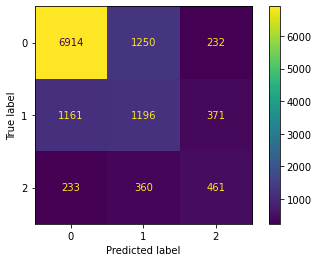

In [ ]:


y_pred= DT_Over_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(DT_Over_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=DT_Over_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=DT_Over_model.classes_).plot()
plt.show()

In [ ]:
RF_Over_model = RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800, random_state=random_seed)
# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(RF_Over_model, X_train_ROS, y_train_ROS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)


/usr/local/lib/python3.9/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


F-measure: 0.935


In [ ]:
RF_Over_model.fit(X_train_ROS, y_train_ROS)

RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800)

In [ ]:
RF_Over_model.score(X_test, y_test)

0.7695023813434061

Accuracy of RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800) is 0.7695023813434061
              precision    recall  f1-score   support

     class 1       0.91      0.83      0.87      8396
     class 2       0.50      0.72      0.59      2728
     class 3       0.69      0.42      0.52      1054

    accuracy                           0.77     12178
   macro avg       0.70      0.66      0.66     12178
weighted avg       0.80      0.77      0.78     12178



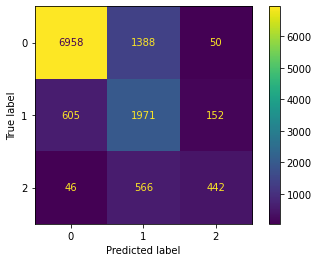

In [ ]:
y_pred= RF_Over_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(RF_Over_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=RF_Over_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=RF_Over_model.classes_).plot()
plt.show()

## removing '<' from labels to allow for xgboost

In [ ]:
sub = '<'

to_change = [x for x in X.columns if sub in x]

In [ ]:
to_change

[]

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train_ROS = le.fit_transform(y_train_ROS)

In [ ]:
y_test = le.fit_transform(y_test)

In [ ]:
import xgboost

In [ ]:
XGB_model = xgboost.XGBClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(XGB_model, X_train_ROS, y_train_ROS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.919


In [ ]:
XGB_model.fit(X_train_ROS, y_train_ROS)
XGB_model.score(X_test, y_test)


0.7867465922154705

Accuracy of XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...) is 0.7867465922154705
              precision    recall  f1-score   support

     class 1       0.93      0.82      0.87      8396
     class 2       0.53      0.73      0.61      2728
     class 3       0.69      0.68      0.68      1054

    accuracy                       

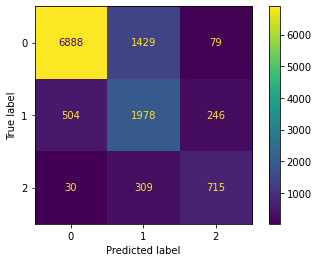

In [ ]:
y_pred= XGB_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(XGB_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=XGB_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=XGB_model.classes_).plot()
plt.show()

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 20.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.2/15.2 MB 66.9 MB/s eta 0:00:0000:0100:01


In [ ]:
import catboost

In [ ]:
cat_model = catboost.CatBoostClassifier(random_seed=random_seed)

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(cat_model, X_train_ROS, y_train_ROS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

Learning rate set to 0.098146
0:	learn: 1.0414380	total: 167ms	remaining: 2m 46s
1:	learn: 0.9930256	total: 281ms	remaining: 2m 20s
2:	learn: 0.9510043	total: 545ms	remaining: 3m 1s
3:	learn: 0.9188483	total: 817ms	remaining: 3m 23s
4:	learn: 0.8902822	total: 1.11s	remaining: 3m 41s
5:	learn: 0.8629480	total: 1.47s	remaining: 4m 3s
6:	learn: 0.8398578	total: 1.71s	remaining: 4m 3s
7:	learn: 0.8209655	total: 1.96s	remaining: 4m 3s
8:	learn: 0.8037532	total: 2.18s	remaining: 3m 59s
9:	learn: 0.7882746	total: 2.45s	remaining: 4m 2s
10:	learn: 0.7738254	total: 2.69s	remaining: 4m 1s
11:	learn: 0.7619195	total: 3.08s	remaining: 4m 13s
12:	learn: 0.7525279	total: 3.31s	remaining: 4m 11s
13:	learn: 0.7420061	total: 3.58s	remaining: 4m 11s
14:	learn: 0.7322539	total: 3.87s	remaining: 4m 14s
15:	learn: 0.7240233	total: 4.11s	remaining: 4m 12s
16:	learn: 0.7161223	total: 4.37s	remaining: 4m 12s
17:	learn: 0.7091465	total: 4.61s	remaining: 4m 11s
18:	learn: 0.7021052	total: 4.82s	remaining: 4m 9s

/usr/local/lib/python3.9/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


925:	learn: 0.2775342	total: 3m 19s	remaining: 16s
926:	learn: 0.2773647	total: 3m 19s	remaining: 15.7s
927:	learn: 0.2772693	total: 3m 20s	remaining: 15.5s
928:	learn: 0.2771197	total: 3m 20s	remaining: 15.3s
929:	learn: 0.2770038	total: 3m 20s	remaining: 15.1s
930:	learn: 0.2769121	total: 3m 20s	remaining: 14.9s
931:	learn: 0.2768295	total: 3m 21s	remaining: 14.7s
932:	learn: 0.2767080	total: 3m 21s	remaining: 14.4s
933:	learn: 0.2765363	total: 3m 21s	remaining: 14.2s
934:	learn: 0.2763960	total: 3m 21s	remaining: 14s
935:	learn: 0.2761685	total: 3m 21s	remaining: 13.8s
936:	learn: 0.2760347	total: 3m 22s	remaining: 13.6s
937:	learn: 0.2759251	total: 3m 22s	remaining: 13.4s
938:	learn: 0.2757987	total: 3m 22s	remaining: 13.2s
939:	learn: 0.2757292	total: 3m 22s	remaining: 12.9s
940:	learn: 0.2756429	total: 3m 23s	remaining: 12.7s
941:	learn: 0.2754874	total: 3m 23s	remaining: 12.5s
942:	learn: 0.2752627	total: 3m 23s	remaining: 12.3s
943:	learn: 0.2751976	total: 3m 23s	remaining: 12.

In [ ]:
cat_model.fit(X_train_ROS, y_train_ROS)
cat_model.score(X_test, y_test)

Learning rate set to 0.098675
0:	learn: 1.0426057	total: 100ms	remaining: 1m 40s
1:	learn: 0.9935472	total: 143ms	remaining: 1m 11s
2:	learn: 0.9510942	total: 184ms	remaining: 1m 1s
3:	learn: 0.9170798	total: 222ms	remaining: 55.2s
4:	learn: 0.8886727	total: 266ms	remaining: 52.9s
5:	learn: 0.8614224	total: 308ms	remaining: 51s
6:	learn: 0.8385147	total: 353ms	remaining: 50.1s
7:	learn: 0.8192626	total: 392ms	remaining: 48.6s
8:	learn: 0.8014191	total: 436ms	remaining: 48s
9:	learn: 0.7851924	total: 483ms	remaining: 47.9s
10:	learn: 0.7713091	total: 528ms	remaining: 47.5s
11:	learn: 0.7595848	total: 573ms	remaining: 47.1s
12:	learn: 0.7487040	total: 614ms	remaining: 46.6s
13:	learn: 0.7384181	total: 656ms	remaining: 46.2s
14:	learn: 0.7288566	total: 697ms	remaining: 45.8s
15:	learn: 0.7204035	total: 736ms	remaining: 45.3s
16:	learn: 0.7133243	total: 774ms	remaining: 44.8s
17:	learn: 0.7057717	total: 813ms	remaining: 44.4s
18:	learn: 0.6990093	total: 847ms	remaining: 43.7s
19:	learn: 0.

0.7824765971423879

Accuracy of <catboost.core.CatBoostClassifier object at 0x7fc828352f70> is 0.7824765971423879
              precision    recall  f1-score   support

     class 1       0.94      0.81      0.87      8396
     class 2       0.52      0.73      0.61      2728
     class 3       0.66      0.70      0.68      1054

    accuracy                           0.78     12178
   macro avg       0.71      0.75      0.72     12178
weighted avg       0.82      0.78      0.79     12178



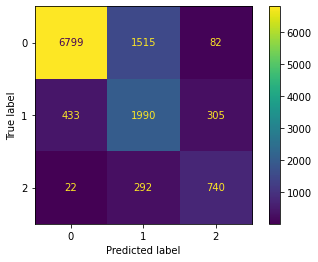

In [ ]:
y_pred= cat_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(cat_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=cat_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=cat_model.classes_).plot()
plt.show()

In [ ]:
!pip install lightgbm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 66.2 MB/s eta 0:00:00


In [ ]:
import lightgbm

In [ ]:
light_model = lightgbm.LGBMClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(light_model, X_train_ROS, y_train_ROS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.873


In [ ]:
light_model.fit(X_train_ROS, y_train_ROS)
light_model.score(X_test, y_test)

0.7754146822138283

Accuracy of LGBMClassifier() is 0.7754146822138283
              precision    recall  f1-score   support

     class 1       0.95      0.79      0.86      8396
     class 2       0.52      0.74      0.61      2728
     class 3       0.63      0.75      0.69      1054

    accuracy                           0.78     12178
   macro avg       0.70      0.76      0.72     12178
weighted avg       0.82      0.78      0.79     12178



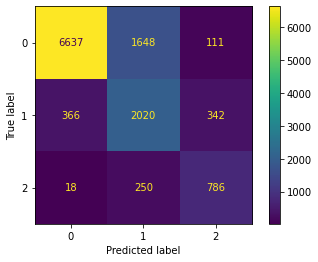

In [ ]:
y_pred= light_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(light_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=light_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=light_model.classes_).plot()
plt.show()

## Random undersampling to address class distribution

In [ ]:

from imblearn.under_sampling import RandomUnderSampler

In [ ]:
under = RandomUnderSampler(random_state=random_seed, sampling_strategy='majority')

In [ ]:
X_train_RUS, y_train_RUS = under.fit_resample(X_train, y_train)
print(Counter(y_train_RUS))

Counter({1: 8211, 0: 3033, 2: 3033})


In [ ]:

DT_Under_model = DecisionTreeClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(DT_Under_model, X_train_RUS, y_train_RUS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.638


In [ ]:
DT_Under_model.fit(X_train_RUS, y_train_RUS)

DecisionTreeClassifier()

In [ ]:
DT_Under_model.classes_

array([0, 1, 2])

In [ ]:
y_pred= DT_Under_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(DT_Under_model, acc))

Accuracy of DecisionTreeClassifier() is 0.650188865166694


In [ ]:
np.count_nonzero(y_pred == 3)

0

              precision    recall  f1-score   support

     class 1       0.93      0.65      0.77      8396
     class 2       0.39      0.70      0.50      2728
     class 3       0.37      0.49      0.42      1054

    accuracy                           0.65     12178
   macro avg       0.56      0.61      0.56     12178
weighted avg       0.76      0.65      0.68     12178



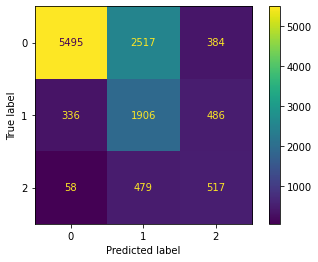

In [ ]:
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=DT_Under_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=DT_Under_model.classes_).plot()
plt.show()

In [ ]:
RF_Under_model = RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800, random_state=random_seed)
# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(RF_Under_model, X_train_RUS, y_train_RUS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.725


In [ ]:
RF_Under_model.fit(X_train_RUS, y_train_RUS)

RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800)

In [ ]:
RF_Under_model.score(X_test, y_test)

0.6020693053046478

Accuracy of RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800) is 0.6020693053046478
              precision    recall  f1-score   support

     class 1       1.00      0.52      0.69      8396
     class 2       0.36      0.96      0.52      2728
     class 3       0.72      0.31      0.44      1054

    accuracy                           0.60     12178
   macro avg       0.69      0.60      0.55     12178
weighted avg       0.83      0.60      0.63     12178



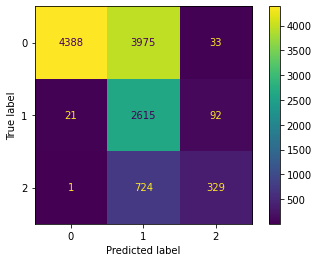

In [ ]:
y_pred= RF_Under_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(RF_Under_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=RF_Under_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=RF_Under_model.classes_).plot()
plt.show()

In [ ]:
XGB_Under_model = xgboost.XGBClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(XGB_Under_model, X_train_RUS, y_train_RUS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.778


In [ ]:
XGB_Under_model.fit(X_train_RUS, y_train_RUS)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [ ]:
XGB_Under_model.score(X_test, y_test)

0.687387091476433

Accuracy of RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800) is 0.687387091476433
              precision    recall  f1-score   support

     class 1       0.98      0.63      0.77      8396
     class 2       0.41      0.91      0.57      2728
     class 3       0.78      0.57      0.66      1054

    accuracy                           0.69     12178
   macro avg       0.72      0.70      0.66     12178
weighted avg       0.84      0.69      0.71     12178



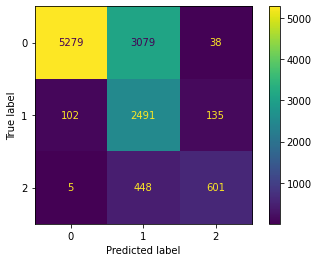

In [ ]:
y_pred= XGB_Under_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(RF_Under_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=XGB_Under_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=XGB_Under_model.classes_).plot()
plt.show()

In [ ]:
catboost_Under_model = catboost.CatBoostClassifier(random_seed=random_seed)

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(catboost_Under_model, X_train_RUS, y_train_RUS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

857:	learn: 0.2876359	total: 3m 1s	remaining: 30s
858:	learn: 0.2874936	total: 3m 1s	remaining: 29.8s
859:	learn: 0.2873050	total: 3m 1s	remaining: 29.6s
860:	learn: 0.2871919	total: 3m 1s	remaining: 29.4s
861:	learn: 0.2870260	total: 3m 2s	remaining: 29.2s
862:	learn: 0.2868406	total: 3m 2s	remaining: 28.9s
863:	learn: 0.2866262	total: 3m 2s	remaining: 28.7s
864:	learn: 0.2864940	total: 3m 2s	remaining: 28.5s
865:	learn: 0.2864501	total: 3m 2s	remaining: 28.3s
866:	learn: 0.2863195	total: 3m 3s	remaining: 28.1s
867:	learn: 0.2861753	total: 3m 3s	remaining: 27.9s
868:	learn: 0.2859921	total: 3m 3s	remaining: 27.7s
869:	learn: 0.2857988	total: 3m 3s	remaining: 27.4s
870:	learn: 0.2856737	total: 3m 3s	remaining: 27.2s
871:	learn: 0.2854679	total: 3m 4s	remaining: 27s
872:	learn: 0.2852454	total: 3m 4s	remaining: 26.8s
873:	learn: 0.2851123	total: 3m 4s	remaining: 26.6s
874:	learn: 0.2849954	total: 3m 4s	remaining: 26.4s
875:	learn: 0.2848009	total: 3m 5s	remaining: 26.2s
876:	learn: 0.28

In [ ]:
catboost_Under_model.fit(X_train_ROS, y_train_ROS)
catboost_Under_model.score(X_test, y_test)

Learning rate set to 0.098675
0:	learn: 1.0426057	total: 52.8ms	remaining: 52.8s
1:	learn: 0.9935472	total: 101ms	remaining: 50.3s
2:	learn: 0.9510942	total: 158ms	remaining: 52.4s
3:	learn: 0.9170798	total: 208ms	remaining: 51.9s
4:	learn: 0.8886727	total: 256ms	remaining: 50.9s
5:	learn: 0.8614224	total: 301ms	remaining: 49.9s
6:	learn: 0.8385147	total: 350ms	remaining: 49.7s
7:	learn: 0.8192626	total: 391ms	remaining: 48.5s
8:	learn: 0.8014191	total: 440ms	remaining: 48.4s
9:	learn: 0.7851924	total: 485ms	remaining: 48s
10:	learn: 0.7713091	total: 528ms	remaining: 47.5s
11:	learn: 0.7595848	total: 574ms	remaining: 47.2s
12:	learn: 0.7487040	total: 617ms	remaining: 46.8s
13:	learn: 0.7384181	total: 663ms	remaining: 46.7s
14:	learn: 0.7288566	total: 715ms	remaining: 47s
15:	learn: 0.7204035	total: 756ms	remaining: 46.5s
16:	learn: 0.7133243	total: 796ms	remaining: 46.1s
17:	learn: 0.7057717	total: 838ms	remaining: 45.7s
18:	learn: 0.6990093	total: 872ms	remaining: 45s
19:	learn: 0.693

0.7824765971423879

Accuracy of RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800) is 0.7824765971423879
              precision    recall  f1-score   support

     class 1       0.94      0.81      0.87      8396
     class 2       0.52      0.73      0.61      2728
     class 3       0.66      0.70      0.68      1054

    accuracy                           0.78     12178
   macro avg       0.71      0.75      0.72     12178
weighted avg       0.82      0.78      0.79     12178



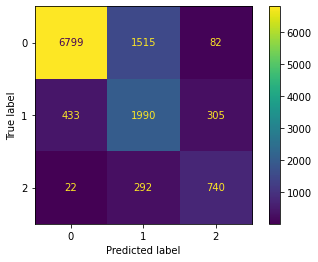

In [ ]:
y_pred= catboost_Under_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(catboost_Under_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=catboost_Under_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=catboost_Under_model.classes_).plot()
plt.show()

In [ ]:
light_under_model = lightgbm.LGBMClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(light_under_model, X_train_RUS, y_train_RUS, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.782


In [ ]:
light_under_model.fit(X_train_ROS, y_train_ROS)
light_under_model.score(X_test, y_test)

0.7754146822138283

Accuracy of RandomForestClassifier(max_depth=25, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=800) is 0.7754146822138283
              precision    recall  f1-score   support

     class 1       0.95      0.79      0.86      8396
     class 2       0.52      0.74      0.61      2728
     class 3       0.63      0.75      0.69      1054

    accuracy                           0.78     12178
   macro avg       0.70      0.76      0.72     12178
weighted avg       0.82      0.78      0.79     12178



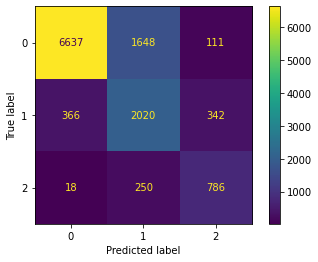

In [ ]:
y_pred= light_under_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(light_under_model, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=light_under_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=light_under_model.classes_).plot()
plt.show()

## SMOTE oversampling


In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
SMOTE_over = SMOTE(random_state = random_seed, sampling_strategy='not majority', k_neighbors=3)

In [ ]:
X_train_SMOV, y_train_SMOV = SMOTE_over.fit_resample(X_train, y_train)

In [ ]:
y_train

array([0, 0, 1, ..., 1, 0, 0])

In [ ]:

DT_SMOTE_Over = DecisionTreeClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(DT_SMOTE_Under, X_train_SMOV, y_train_SMOV, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.799


In [ ]:
DT_SMOTE_Over.fit(X_train_SMOV, y_train_SMOV)

DecisionTreeClassifier()

Accuracy of DecisionTreeClassifier() is 0.7154705206109377
              precision    recall  f1-score   support

     class 1       0.86      0.82      0.84      8396
     class 2       0.45      0.48      0.46      2728
     class 3       0.41      0.46      0.43      1054

    accuracy                           0.72     12178
   macro avg       0.57      0.59      0.58     12178
weighted avg       0.73      0.72      0.72     12178



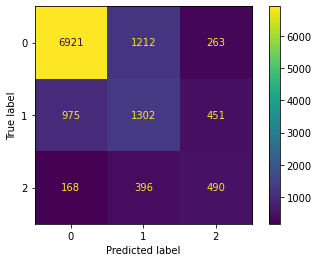

In [ ]:
y_pred= DT_SMOTE_Over.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(DT_SMOTE_Over, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=DT_SMOTE_Over.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=DT_SMOTE_Over.classes_).plot()
plt.show()

In [ ]:

RF_SMOTE_over  = RandomForestClassifier()
# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(RF_SMOTE_over, X_train_SMOV, y_train_SMOV, scoring='f1_micro', cv=cv, n_jobs=-1)
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.894


In [ ]:
RF_SMOTE_over.fit(X_train_SMOV, y_train_SMOV)

RandomForestClassifier()

Accuracy of RandomForestClassifier() is 0.7758252586631631
              precision    recall  f1-score   support

     class 1       0.90      0.85      0.88      8396
     class 2       0.52      0.65      0.58      2728
     class 3       0.63      0.49      0.55      1054

    accuracy                           0.78     12178
   macro avg       0.68      0.66      0.67     12178
weighted avg       0.79      0.78      0.78     12178



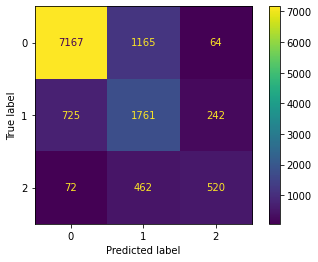

In [ ]:
y_pred= RF_SMOTE_over.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(RF_SMOTE_over, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=RF_SMOTE_over.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=RF_SMOTE_over.classes_).plot()
plt.show()

In [ ]:
XGB_SMOTE_over = xgboost.XGBClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(XGB_SMOTE_over, X_train_SMOV, y_train_SMOV, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.895


In [ ]:
XGB_SMOTE_over.fit(X_train_SMOV, y_train_SMOV)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

Accuracy of XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...) is 0.803744457217934
              precision    recall  f1-score   support

     class 1       0.88      0.90      0.89      8396
     class 2       0.59      0.58      0.58      2728
     class 3       0.75      0.62      0.68      1054

    accuracy                        

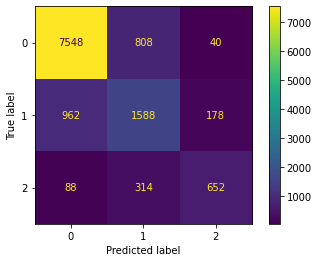

In [ ]:
y_pred= XGB_SMOTE_over.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(XGB_SMOTE_over, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=XGB_SMOTE_over.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=XGB_SMOTE_over.classes_).plot()
plt.show()

In [ ]:
catboost_SMOTE_over = catboost.CatBoostClassifier(random_seed=random_seed)

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(catboost_SMOTE_over, X_train_SMOV, y_train_SMOV, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

924:	learn: 0.2877050	total: 1m 44s	remaining: 8.46s
925:	learn: 0.2875809	total: 1m 44s	remaining: 8.36s
926:	learn: 0.2874467	total: 1m 44s	remaining: 8.24s
927:	learn: 0.2872886	total: 1m 44s	remaining: 8.13s
928:	learn: 0.2871858	total: 1m 44s	remaining: 8.02s
929:	learn: 0.2869244	total: 1m 45s	remaining: 7.91s
930:	learn: 0.2867882	total: 1m 45s	remaining: 7.8s
931:	learn: 0.2865139	total: 1m 45s	remaining: 7.69s
932:	learn: 0.2863908	total: 1m 45s	remaining: 7.57s
933:	learn: 0.2862019	total: 1m 45s	remaining: 7.46s
934:	learn: 0.2860305	total: 1m 45s	remaining: 7.35s
935:	learn: 0.2858606	total: 1m 45s	remaining: 7.23s
936:	learn: 0.2857384	total: 1m 45s	remaining: 7.12s
937:	learn: 0.2856477	total: 1m 46s	remaining: 7.01s
938:	learn: 0.2853724	total: 1m 46s	remaining: 6.9s
939:	learn: 0.2852365	total: 1m 46s	remaining: 6.79s
940:	learn: 0.2851222	total: 1m 46s	remaining: 6.67s
941:	learn: 0.2850631	total: 1m 46s	remaining: 6.56s
942:	learn: 0.2849144	total: 1m 46s	remaining: 6

In [ ]:
catboost_SMOTE_over.fit(X_train_SMOV, y_train_SMOV)

Learning rate set to 0.098675
0:	learn: 1.0289646	total: 55.2ms	remaining: 55.1s
1:	learn: 0.9721683	total: 103ms	remaining: 51.2s
2:	learn: 0.9267365	total: 146ms	remaining: 48.4s
3:	learn: 0.8869796	total: 188ms	remaining: 46.9s
4:	learn: 0.8505421	total: 233ms	remaining: 46.3s
5:	learn: 0.8159114	total: 280ms	remaining: 46.5s
6:	learn: 0.7873022	total: 324ms	remaining: 45.9s
7:	learn: 0.7620245	total: 365ms	remaining: 45.2s
8:	learn: 0.7405931	total: 408ms	remaining: 44.9s
9:	learn: 0.7212886	total: 450ms	remaining: 44.5s
10:	learn: 0.7034572	total: 497ms	remaining: 44.7s
11:	learn: 0.6892604	total: 544ms	remaining: 44.8s
12:	learn: 0.6748560	total: 585ms	remaining: 44.4s
13:	learn: 0.6614516	total: 633ms	remaining: 44.6s
14:	learn: 0.6479330	total: 681ms	remaining: 44.7s
15:	learn: 0.6386870	total: 726ms	remaining: 44.6s
16:	learn: 0.6267150	total: 771ms	remaining: 44.6s
17:	learn: 0.6170730	total: 811ms	remaining: 44.3s
18:	learn: 0.6076120	total: 854ms	remaining: 44.1s
19:	learn:

Accuracy of <catboost.core.CatBoostClassifier object at 0x7fc80c85f8b0> is 0.8125307932337001
              precision    recall  f1-score   support

     class 1       0.89      0.90      0.90      8396
     class 2       0.60      0.61      0.61      2728
     class 3       0.75      0.62      0.68      1054

    accuracy                           0.81     12178
   macro avg       0.75      0.71      0.73     12178
weighted avg       0.81      0.81      0.81     12178



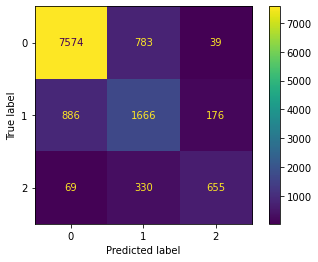

In [ ]:
y_pred= catboost_SMOTE_over.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(catboost_SMOTE_over, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=catboost_SMOTE_over.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=catboost_SMOTE_over.classes_).plot()
plt.show()

In [ ]:
light_SMOTE_over = lightgbm.LGBMClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(light_SMOTE_over, X_train_SMOV, y_train_SMOV, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.869


In [ ]:
light_SMOTE_over.fit(X_train_SMOV, y_train_SMOV)

LGBMClassifier()

Accuracy of LGBMClassifier() is 0.809656758088356
              precision    recall  f1-score   support

     class 1       0.88      0.90      0.89      8396
     class 2       0.60      0.59      0.60      2728
     class 3       0.75      0.64      0.69      1054

    accuracy                           0.81     12178
   macro avg       0.74      0.71      0.73     12178
weighted avg       0.81      0.81      0.81     12178



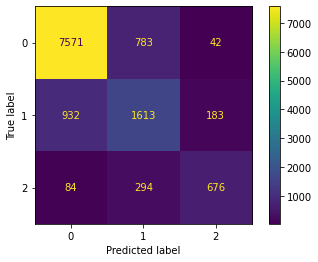

In [ ]:
y_pred= light_SMOTE_over.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(light_SMOTE_over, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=light_SMOTE_over.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=light_SMOTE_over.classes_).plot()
plt.show()

## Combining over & under



In [ ]:
print(Counter(y_train))

over = RandomOverSampler(sampling_strategy='all')
under = RandomUnderSampler(sampling_strategy='all')

Counter({0: 25288, 1: 8211, 2: 3033})


In [ ]:
X_train_ROS_combi, y_train_ROS_combi = over.fit_resample(X_train, y_train)
print(Counter(y_train_ROS_combi))

Counter({0: 25288, 1: 25288, 2: 25288})


In [ ]:
X_train_combi, y_train_combi = under.fit_resample(X_train_ROS_combi, y_train_ROS_combi)
print(Counter(y_train_ROS_combi))

Counter({0: 25288, 1: 25288, 2: 25288})


In [ ]:
light_combi = lightgbm.LGBMClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(light_combi, X_train_combi, y_train_combi, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.872


In [ ]:
light_combi.fit(X_train_combi, y_train_combi)

LGBMClassifier()

Accuracy of LGBMClassifier() is 0.7752504516340942
              precision    recall  f1-score   support

     class 1       0.95      0.79      0.86      8396
     class 2       0.52      0.74      0.61      2728
     class 3       0.62      0.75      0.68      1054

    accuracy                           0.78     12178
   macro avg       0.70      0.76      0.72     12178
weighted avg       0.82      0.78      0.79     12178



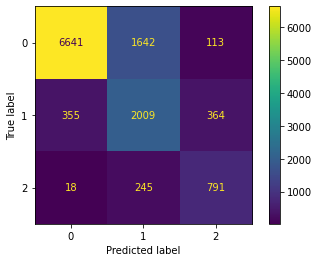

In [ ]:
y_pred= light_combi.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(light_combi, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=light_combi.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=light_combi.classes_).plot()
plt.show()

In [ ]:
DT_combi = DecisionTreeClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(DT_combi, X_train_combi, y_train_combi, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.931


In [ ]:
DT_combi.fit(X_train_combi, y_train_combi)

DecisionTreeClassifier()

Accuracy of DecisionTreeClassifier() is 0.7139103301034653
              precision    recall  f1-score   support

     class 1       0.83      0.83      0.83      8396
     class 2       0.44      0.44      0.44      2728
     class 3       0.46      0.45      0.45      1054

    accuracy                           0.71     12178
   macro avg       0.58      0.58      0.58     12178
weighted avg       0.71      0.71      0.71     12178



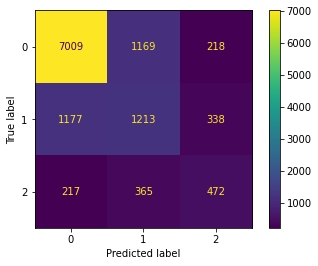

In [ ]:
y_pred= DT_combi.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(DT_combi, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=DT_combi.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=DT_combi.classes_).plot()
plt.show()

In [ ]:
RF_combi  = RandomForestClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(RF_combi, X_train_combi, y_train_combi, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.945


In [ ]:
RF_combi.fit(X_train_combi, y_train_combi)

RandomForestClassifier()

Accuracy of RandomForestClassifier() is 0.7715552635900804
              precision    recall  f1-score   support

     class 1       0.89      0.86      0.87      8396
     class 2       0.51      0.66      0.57      2728
     class 3       0.70      0.38      0.49      1054

    accuracy                           0.77     12178
   macro avg       0.70      0.63      0.65     12178
weighted avg       0.79      0.77      0.77     12178



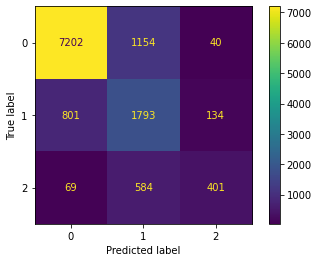

853:	learn: 0.2257713	total: 3m 25s	remaining: 35.1s
854:	learn: 0.2256672	total: 3m 25s	remaining: 34.9s
855:	learn: 0.2255475	total: 3m 25s	remaining: 34.6s
856:	learn: 0.2254394	total: 3m 25s	remaining: 34.4s
857:	learn: 0.2253693	total: 3m 26s	remaining: 34.1s
858:	learn: 0.2252845	total: 3m 26s	remaining: 33.9s
859:	learn: 0.2251398	total: 3m 26s	remaining: 33.6s
860:	learn: 0.2250714	total: 3m 26s	remaining: 33.4s
861:	learn: 0.2249571	total: 3m 27s	remaining: 33.2s
862:	learn: 0.2248600	total: 3m 27s	remaining: 32.9s
863:	learn: 0.2247266	total: 3m 27s	remaining: 32.7s
864:	learn: 0.2245616	total: 3m 27s	remaining: 32.4s
865:	learn: 0.2244576	total: 3m 27s	remaining: 32.2s
866:	learn: 0.2241827	total: 3m 28s	remaining: 31.9s
867:	learn: 0.2240668	total: 3m 28s	remaining: 31.7s
868:	learn: 0.2239795	total: 3m 28s	remaining: 31.5s
869:	learn: 0.2239172	total: 3m 28s	remaining: 31.2s
870:	learn: 0.2238247	total: 3m 29s	remaining: 31s
871:	learn: 0.2236983	total: 3m 29s	remaining: 3

In [ ]:
y_pred= RF_combi.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(RF_combi, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=RF_combi.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=RF_combi.classes_).plot()
plt.show()

In [ ]:
cat_combi = catboost.CatBoostClassifier(random_seed=random_seed)

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(cat_combi, X_train_combi, y_train_combi, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

Learning rate set to 0.098146
0:	learn: 1.0415768	total: 189ms	remaining: 3m 8s
1:	learn: 0.9969072	total: 250ms	remaining: 2m 4s
2:	learn: 0.9559236	total: 305ms	remaining: 1m 41s
3:	learn: 0.9208946	total: 490ms	remaining: 2m 1s
4:	learn: 0.8902229	total: 732ms	remaining: 2m 25s
5:	learn: 0.8660932	total: 905ms	remaining: 2m 29s
6:	learn: 0.8444670	total: 1.15s	remaining: 2m 43s
7:	learn: 0.8253742	total: 1.45s	remaining: 2m 59s
8:	learn: 0.8082397	total: 1.69s	remaining: 3m 6s
9:	learn: 0.7919156	total: 1.92s	remaining: 3m 10s
10:	learn: 0.7784137	total: 2.12s	remaining: 3m 10s
11:	learn: 0.7659885	total: 2.39s	remaining: 3m 16s
12:	learn: 0.7548382	total: 2.65s	remaining: 3m 21s
13:	learn: 0.7429358	total: 2.95s	remaining: 3m 27s
14:	learn: 0.7328123	total: 3.21s	remaining: 3m 30s
15:	learn: 0.7244570	total: 3.48s	remaining: 3m 33s
16:	learn: 0.7168568	total: 3.72s	remaining: 3m 34s
17:	learn: 0.7097346	total: 3.99s	remaining: 3m 37s
18:	learn: 0.7032942	total: 4.28s	remaining: 3m 

In [ ]:
cat_combi.fit(X_train_combi, y_train_combi)

Learning rate set to 0.098675
0:	learn: 1.0413406	total: 52.7ms	remaining: 52.6s
1:	learn: 0.9924955	total: 94.2ms	remaining: 47s
2:	learn: 0.9521100	total: 133ms	remaining: 44.2s
3:	learn: 0.9202001	total: 171ms	remaining: 42.6s
4:	learn: 0.8908059	total: 215ms	remaining: 42.8s
5:	learn: 0.8641524	total: 255ms	remaining: 42.3s
6:	learn: 0.8431485	total: 297ms	remaining: 42.1s
7:	learn: 0.8231467	total: 337ms	remaining: 41.8s
8:	learn: 0.8052748	total: 381ms	remaining: 42s
9:	learn: 0.7893102	total: 422ms	remaining: 41.8s
10:	learn: 0.7752933	total: 462ms	remaining: 41.5s
11:	learn: 0.7625691	total: 504ms	remaining: 41.5s
12:	learn: 0.7509952	total: 551ms	remaining: 41.8s
13:	learn: 0.7395769	total: 596ms	remaining: 42s
14:	learn: 0.7299881	total: 637ms	remaining: 41.8s
15:	learn: 0.7214583	total: 682ms	remaining: 41.9s
16:	learn: 0.7147314	total: 723ms	remaining: 41.8s
17:	learn: 0.7077133	total: 761ms	remaining: 41.5s
18:	learn: 0.7014901	total: 800ms	remaining: 41.3s
19:	learn: 0.69

Accuracy of <catboost.core.CatBoostClassifier object at 0x7fc80ca53bb0> is 0.7807521760551814
              precision    recall  f1-score   support

     class 1       0.94      0.81      0.87      8396
     class 2       0.52      0.72      0.60      2728
     class 3       0.65      0.71      0.68      1054

    accuracy                           0.78     12178
   macro avg       0.70      0.75      0.72     12178
weighted avg       0.82      0.78      0.79     12178



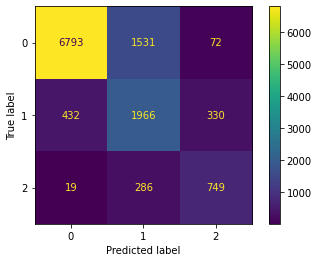

936:	learn: 0.2721339	total: 3m 20s	remaining: 13.5s
937:	learn: 0.2719972	total: 3m 20s	remaining: 13.3s
938:	learn: 0.2718634	total: 3m 20s	remaining: 13.1s
939:	learn: 0.2717447	total: 3m 21s	remaining: 12.8s
940:	learn: 0.2714724	total: 3m 21s	remaining: 12.6s
941:	learn: 0.2712922	total: 3m 21s	remaining: 12.4s
942:	learn: 0.2712263	total: 3m 21s	remaining: 12.2s
943:	learn: 0.2711327	total: 3m 22s	remaining: 12s
944:	learn: 0.2710399	total: 3m 22s	remaining: 11.8s
945:	learn: 0.2709421	total: 3m 22s	remaining: 11.6s
946:	learn: 0.2708345	total: 3m 22s	remaining: 11.3s
947:	learn: 0.2706973	total: 3m 22s	remaining: 11.1s
948:	learn: 0.2705624	total: 3m 23s	remaining: 10.9s
949:	learn: 0.2704608	total: 3m 23s	remaining: 10.7s
950:	learn: 0.2703719	total: 3m 23s	remaining: 10.5s
951:	learn: 0.2702589	total: 3m 23s	remaining: 10.3s
952:	learn: 0.2701815	total: 3m 23s	remaining: 10.1s
953:	learn: 0.2701309	total: 3m 24s	remaining: 9.84s
954:	learn: 0.2699476	total: 3m 24s	remaining: 9

In [ ]:
y_pred= cat_combi.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(cat_combi, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=cat_combi.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=cat_combi.classes_).plot()
plt.show()

In [ ]:
xgb_combi = xgboost.XGBClassifier()

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(xgb_combi, X_train_combi, y_train_combi, scoring='f1_micro', cv=cv, n_jobs=-1) 
score = mean(scores)
print('F-measure: %.3f' % score)

F-measure: 0.920


In [ ]:
xgb_combi.fit(X_train_combi, y_train_combi)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

Accuracy of XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...) is 0.7813269830842503
              precision    recall  f1-score   support

     class 1       0.93      0.82      0.87      8396
     class 2       0.52      0.72      0.61      2728
     class 3       0.67      0.67      0.67      1054

    accuracy                       

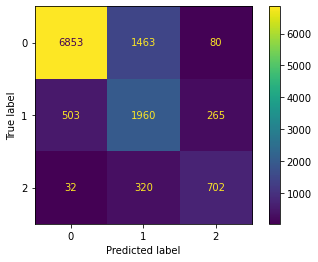

In [ ]:
y_pred= xgb_combi.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("Accuracy of %s is %s"%(xgb_combi, acc))
target_names = ['class 1', 'class 2', 'class 3']
print(classification_report(y_test, y_pred, target_names=target_names))
cm = confusion_matrix(y_test, y_pred, labels=xgb_combi.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=xgb_combi.classes_).plot()
plt.show()

## Save the SMOTE over sampled data

In [ ]:
X_train_SMOV.to_csv('Data/X_train_SMOV.csv')

In [ ]:
df = pd.DataFrame(y_train_SMOV)

df.to_csv('Data/y_train_SMOV.csv')